In [30]:
from selenium import webdriver
import time
from bs4 import BeautifulSoup

In [27]:
%pylab inline
import matplotlib.pyplot as plt 
import pandas as pd
from pandas import DataFrame
import re

Populating the interactive namespace from numpy and matplotlib


In [ ]:
def crawler_591(db,zone):
    options = webdriver.ChromeOptions()
    prefs = {
        'profile.default_content_setting_values':
            {
                'notifications': 2
            }
    }
    options.add_experimental_option('prefs', prefs)  # 關掉瀏覽器左上角的通知提示
    options.add_argument("disable-infobars")  # 關閉 'chrome正受到自動測試軟件的控制'提示

    #get first page
    chromedriver = '/usr/local/bin/chromedriver'
    driver = webdriver.Chrome(chromedriver, chrome_options=options)
    driver.get("https://rent.591.com.tw/?kind=0&region=8")
    time.sleep(4)

    #set localition
    #選擇城市(ex.台中)
    area = driver.find_element_by_css_selector('.pull-left[data-id="8"]')
    area.click()
    time.sleep(2)
    #選擇區域(ex.西屯區)
    zone_ = '//*[@id="optionBox"]/li[' + str(zone) + ']/label/span'
    orz2 = driver.find_element_by_xpath(zone_)
    #orz2 = driver.find_element_by_xpath('//*[@id="optionBox"]/li[1]/label/span')
    driver.execute_script("arguments[0].click();", orz2)
    time.sleep(1)

    #取得總頁數
    pageSource = driver.page_source  # 取得網頁原始碼
    soup = BeautifulSoup(pageSource, 'lxml')  # 解析器接手
    tol_house = soup.find('div', attrs={'class':'pull-left hasData'})
    tol_house = (str(tol_house)).split('<')
    tol_house = tol_house[2].split('>')[1]
    tol_pages = (int(tol_house.replace(',',''))//30) + 1

    count = 0
    for _ in range(tol_pages):
    #for _ in range(2): #測試用
        pageSource = driver.page_source  # 取得網頁原始碼
        soup = BeautifulSoup(pageSource, 'lxml')  # 解析器接手
        content = soup.find('div',attrs={'id':'content'})
        #print (len(content))

        for each in content:
            if each.title == None:
                print ("--------count %d--------"  %count)

                if each.em == None : continue

                ems = each.find_all('em')
                address = ems[0].text
                connector = ems[1].text
                update_time = ems[2].text
                update_time = re.sub(u'內更新','',update_time)

                if len(ems) == 4:
                    viewer=ems[3].text
                #else:
                #    viewer=ems[4].text
                viewer = re.sub(u'瀏覽','',viewer)
                price = each.find('div',attrs={'class':'price'}).i.text
                link = each.a.attrs['href']
                link = re.sub(u'//','https://',link);
                #image_src = each.img.attrs['src']
                #pic = image_src
                pic = each.img.attrs['data-original']

                a = each.find_all('p',attrs={'class':'lightBox'})
                for each in a:
                    data=each.text
                    if data.find('|') == -1: 
                        continue
                    data = re.sub(r'\s','',data)
                    data = re.sub(r'\xa0','',data)
                    data = re.sub(r'\u3000','',data)
                    datas = (data.split('|'))  

                    house_type=datas[0]
                    if len(datas) == 3:
                        pattern = ''
                        area = datas[1]
                        floors = datas[2]
                    elif len(datas) == 4:
                        pattern = datas[1]
                        area = datas[2]
                        floors = datas[3]                
                    else:
                        print ("%d ==> %s" %(len(datas), data))

                    area=re.sub(u'坪','',area)
                    floors=re.sub(u'樓層：','',floors)

                col=['house_type','pattern','floor','address','price','pic','area','link','viewer','connector','update_time']
                new_db_line=[house_type, pattern, floors, address, price, pic, area, link, viewer, connector, update_time]

                print ("house, pattern, floor, address, price ,pic ,area, link viewer")
                print (new_db_line[0],new_db_line[1],new_db_line[2],new_db_line[3],new_db_line[4],new_db_line[5],new_db_line[6])
                print (new_db_line[7],new_db_line[8],new_db_line[9],new_db_line[10])

                db_line = pd.DataFrame([new_db_line],columns=col)
                db = db.append(db_line)

                count=count+1


        time.sleep(3)
        driver.find_element_by_link_text('下一頁').click()
        time.sleep(2)


    driver.close()
    driver.quit()
    return db
    
#col = ['house_type','pattern','floor','address','price','pic','area','link','viewer','connector','update_time']
db = DataFrame()

zones = {'西屯區':1,'北區':2,'北屯區':3,'西區':4,'南區':5,'南屯區':6,'太平區':7,'東區':8,'大里區':9,'龍井區':10,
         '中區':11,'沙鹿區':12,'豐原區':13,'潭子區':14,'大雅區':15,'烏日區':16,'霧峰區':17,'梧棲區':18,'清水區':19,'大甲區':20,
         '神岡區':21,'大肚區':22,'后里區':23,'東勢區':24,'新社區':25,'外埔區':26,'石岡區':27,'和平區':28,'大安區':29}
zone = '西屯區'

In [166]:
print(tol_house, tol_pages)
df = db.reset_index(drop=True).copy()
df

3,200 107


,house_type,pattern,floor,address,price,pic,area,link,viewer,connector,update_time
0,獨立套房,,3/6,西屯區-河南路一段,"9,500",https://hp1.591.com.tw/house/active/2019/12/07...,12,https://rent.591.com.tw/rent-detail-8567335.h...,19人,仲介 林小姐,4分鐘
1,分租套房,,2/4,西屯區-西屯路二段297巷,"6,300",https://hp1.591.com.tw/house/active/2019/12/15...,6,https://rent.591.com.tw/rent-detail-8601448.h...,45人,仲介 張小姐,4分鐘
2,獨立套房,,8/8,西屯區-西屯路二段,"5,800",https://hp2.591.com.tw/house/active/2019/12/09...,8,https://rent.591.com.tw/rent-detail-8623106.h...,210人,屋主 小許,4分鐘
3,獨立套房,,3/6,西屯區-福雅路,"9,500",https://hp1.591.com.tw/house/active/2019/10/13...,9,https://rent.591.com.tw/rent-detail-8558649.h...,37人,代理人 陳先生,4分鐘
4,獨立套房,,2/4,西屯區-中平路,"8,999",https://hp2.591.com.tw/house/active/2019/11/29...,13.5,https://rent.591.com.tw/rent-detail-8515975.h...,70人,仲介 謝先生,14分鐘
...,...,...,...,...,...,...,...,...,...,...,...
3205,整層住家,3房2廳3衛,29/35,西屯區-台灣大道三段,"89,500",https://hp1.591.com.tw/house/active/2019/12/02...,111.7,https://rent.591.com.tw/rent-detail-8545043.h...,4人,仲介 徐先生,昨日更新
3206,分租套房,,2/4,西屯區-慶和街21號,"5,200",https://hp2.591.com.tw/house/active/2016/01/13...,7,https://rent.591.com.tw/rent-detail-8632313.h...,15人,仲介 小安,昨日更新
3207,整層住家,4房3廳3衛,12/12,西屯區-大墩二十街96號,"69,999",https://hp2.591.com.tw/house/active/2019/03/19...,53.3,https://rent.591.com.tw/rent-detail-8621788.h...,7人,仲介 小安,昨日更新
3208,獨立套房,,6/7,西屯區-文華路162巷3號,"18,000",https://hp1.591.com.tw/house/active/2019/12/18...,22,https://rent.591.com.tw/rent-detail-8615318.h...,13人,仲介 小安,昨日更新


In [180]:
filename = str(zones[zone]) + '.' + zone + '.csv'
df.to_csv(filename,index=False)

In [181]:
df['house_type'].unique()

array(['獨立套房', '分租套房', '整層住家', '車位', '其他', '雅房'], dtype=object)

In [182]:
df_whole_floor = df[(df['house_type']=='整層住家')|(df['house_type']=='其他')].copy()

df_whole_floor['rooms'] = df_whole_floor['pattern'].apply(lambda x : x[0])
df_whole_floor['living']  = df_whole_floor['pattern'].apply(lambda x : x[2])
df_whole_floor['bathroom']  = df_whole_floor['pattern'].apply(lambda x : x[4])
df_whole_floor['price'] = df_whole_floor['price'].apply(lambda x : int(x.replace(',','')))

In [183]:
#df_whole_floor

In [187]:
df_whole_floor = df_whole_floor[(df_whole_floor['rooms'] == df_whole_floor['bathroom']) & (df_whole_floor['rooms'] != '1')].sort_values(['rooms','price'])
df_whole_floor

,house_type,pattern,floor,address,price,pic,area,link,viewer,connector,update_time,rooms,living,bathroom
2107,整層住家,2房2廳2衛,2/7,西屯區-寧夏路,15000,https://hp2.591.com.tw/house/active/2019/12/22...,25.8,https://rent.591.com.tw/rent-detail-8629281.h...,74人,仲介 吳先生,20小時,2,2,2
2805,整層住家,2房1廳2衛,3/7,西屯區-寧夏路,15000,https://hp1.591.com.tw/house/active/2017/08/05...,30.3,https://rent.591.com.tw/rent-detail-8629087.h...,60人,屋主 林先生,23小時,2,1,2
2059,整層住家,2房1廳2衛,2/5,西屯區-甘肅路一段,15000,https://hp1.591.com.tw/house/active/2019/12/23...,25,https://rent.591.com.tw/rent-detail-8623260.h...,30人,仲介 邱小姐,20小時,2,1,2
2063,整層住家,2房1廳2衛,2/5,西屯區-甘肅路一段,15000,https://hp1.591.com.tw/house/active/2019/12/23...,25,https://rent.591.com.tw/rent-detail-8623258.h...,36人,仲介 邱小姐,20小時,2,1,2
2077,整層住家,2房2廳2衛,2/7,西屯區-寧夏路,15000,https://hp2.591.com.tw/house/active/2019/12/22...,25.8,https://rent.591.com.tw/rent-detail-8629281.h...,74人,仲介 吳先生,20小時,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1694,其他,5房3廳5衛,整棟/4,西屯區-惠來路三段,60000,https://hp2.591.com.tw/house/active/2019/12/23...,107,https://rent.591.com.tw/rent-detail-8635662.h...,4人,仲介 寶咖咖,18小時,5,3,5
2632,整層住家,6房3廳6衛,整棟/4,西屯區-文心一路206巷,75000,https://hp1.591.com.tw/house/active/2019/10/02...,110,https://rent.591.com.tw/rent-detail-8617656.h...,13人,仲介 民先生,22小時,6,3,6
2602,整層住家,6房3廳6衛,整棟/4,西屯區-文心一路206巷,75000,https://hp1.591.com.tw/house/active/2019/10/02...,110,https://rent.591.com.tw/rent-detail-8617656.h...,13人,仲介 民先生,22小時,6,3,6
1133,整層住家,7房4廳7衛,整棟/4,西屯區-文心一路,75000,https://hp2.591.com.tw/house/active/2019/12/18...,171.4,https://rent.591.com.tw/rent-detail-8615279.h...,9人,仲介 住商市政店,3小時,7,4,7


In [145]:
import urllib.request
from skimage import io
import math
import matplotlib.pyplot as plt
%matplotlib inline
#中文顯示
from matplotlib.font_manager import findfont, FontProperties  
findfont(FontProperties(family=FontProperties().get_family())) 

'/Users/dan/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/msj.ttf'

In [185]:
len(df_whole_floor)

203

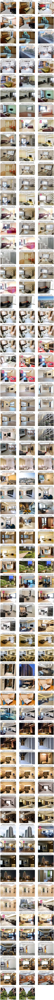

In [192]:
row_len = math.ceil(len(df_whole_floor)/3)
plt.figure(figsize=(18,row_len*5))
for i in range(len(df_whole_floor)):
    
    title = df_whole_floor.iloc[i]['pattern']+' '+df_whole_floor.iloc[i]['floor']+' '+df_whole_floor.iloc[i]['address']+' '+str(df_whole_floor.iloc[i]['price'])+'\n'+df_whole_floor.iloc[i]['link']
    image = io.imread(df_whole_floor.iloc[i]['pic'])
    
    plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei'] 
    plt.rcParams['axes.unicode_minus'] = False
    plt.subplot(row_len,3,i+1)
    plt.title(title)
    plt.axis('off')
    im = plt.imshow(image)
    plt.
    im.set_url(df_whole_floor.iloc[i]['link'])
    #plt.show()